In [1]:
## ======= ##
## IMPORTS ##
## ======= ##

import numpy as np
import pandas as pd
import geopandas as gpd
import xarray as xr
import zarr
import rioxarray
import matplotlib.pyplot as plt
import os
import dask
import dask.array
import math

import datetime

from collections import Counter

import pystac_client
from pystac.extensions.projection import ProjectionExtension as proj

import planetary_computer
import rasterio
import rasterio.features
from rasterio.features import rasterize

import stackstac
import pyproj

import dask.diagnostics

from shapely.geometry import box
from shapely.ops import transform

from scipy.ndimage import binary_propagation
from scipy.ndimage import label

import sat_tile_stack
from sat_tile_stack import sattile_stack, sat_mask_array, write_netcdf_from_da



In [9]:
## ========= ##
## RUN BLOCK ##
## ========= ##

## CONNECT TO MICROSOFT PLANETARY COMPUTER
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,)
print(f"connected to Microsoft Planetary Computer")

# DECIDE WHETHER TO NORMALIZE THE IMAGERY UPON COMPLIING OR NOT
normalize = False

# READ IN THE LAKE INFORMATION .geojson FILE
gdf = gpd.read_file("/home/jupyter/repos/lake-vision/sandbox/dunmire_cw2019_shuttle.geojson")

# LAKE CENTROID
idx_lake = 239
centroid = (gdf.iloc[idx_lake].centroid_x, gdf.iloc[idx_lake].centroid_y)
# centroid = (-122.33, 37.81) # OAKLAND SEAPORT TERMINALS
# centroid = (-122.45957, 37.80539) # CHRISSY FIELD MARSH
# centroid = (-49.495, 68.725) # NORTH LAKE

print(f"\n working on lake {gdf.iloc[idx_lake].lakenum}")

# SPECIFY TIME RANGE
time_range = '2019-05-01/2019-09-30'

# SPECIFY IMAGERY BANDS
band_names = ["B04",  # red (665 nm)
              "B03",  # green (560 nm)
              "B02",  # blue (490 nm)
              "B08"]  # NIR (842 nm)
              # "B11"]  # SWIR1 (1610 nm)

# CALL FUNCTION TO GENERATE TIMESTACK
gdf_mask = gpd.read_file("/home/jupyter/repos/lake-vision/sandbox/dunmire_cw2019_shuttle.geojson")
gdf_mask = gdf_mask.iloc[[idx_lake]]
timestack = sattile_stack(catalog, centroid, band_names, pix_res=10, tile_size=512, time_range=time_range, normalize=False, mask=gdf_mask, pull_to_mem=True)





connected to Microsoft Planetary Computer

 working on lake 2019cw_240
epsg for bounds_latlon: 3413
pulling stack into memory, shape will be: (153, 5, 512, 512)
[########################################] | 100% Completed | 30.85 s
shape of stack in memory: (153, 5, 512, 512)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.67..1.0536].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.615..1.0524].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.6726..1.1172].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.5352..1.0272].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.483..1.046].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.3428..1.0832].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.4568..1.0224].
Clipping input data to the valid range 

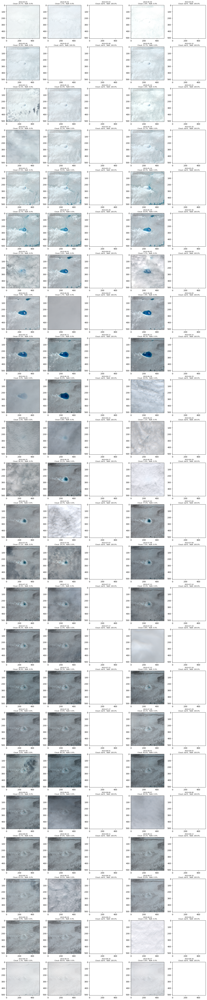

In [10]:
## ================== ##
## PLOTTING WITH MASK ##
## ================== ##

def linear_stretch_rgb(rgb, pmin=2, pmax=98):
    out = np.empty_like(rgb)
    for i in range(3):
        band = rgb[..., i]
        lo, hi = np.nanpercentile(band, (pmin, pmax))
        out[..., i] = np.clip((band - lo) / (hi - lo), 0, 1)
    return out

def plot_n_days(timestack, start_date, ndays=10, cols=4):
    """
    Plot consecutive daily RGB composites in subplots, 
    outlining the mask which is assumed to be the last band.

    Parameters
    ----------
    timestack : xarray.DataArray
        DataArray of shape (time, band, y, x), where band=-1 is the mask.
    start_date : str or np.datetime64
        The first date to plot, e.g. "2019-05-20".
    ndays : int
        Number of days to plot.
    cols : int
        Number of columns in the grid.
    """
    start = np.datetime64(start_date)
    rows = int(np.ceil(ndays / cols))
    fig, axes = plt.subplots(rows, cols, 
                             figsize=(cols*3, rows*3), 
                             constrained_layout=True)
    axes_flat = axes.flatten()

    for i in range(ndays):
        date = start + np.timedelta64(i, "D")
        tslice = timestack.sel(time=date)

        # build and stretch RGB from the *first* three bands
        r = tslice.isel(band=0).values
        g = tslice.isel(band=1).values
        b = tslice.isel(band=2).values
        rgb = np.stack([r, g, b], axis=-1)
        # rgb_st = rgb
        # rgb_st = linear_stretch_rgb(rgb, pmin=0, pmax=100)
        rgb_st = rgb/10000

        ax = axes_flat[i]
        ax.imshow(rgb_st)

        # extract the mask (last band) and draw its 0.5 contour
        m2d = tslice.isel(band=-1).values
        # ax.contour(m2d, levels=[0.5], colors="red", linewidths=1)

        # pull in the pct_nan and eo_cloud_cover
        pct_nan = float(tslice["pct_nans"].values)
        pct_cloud = float(tslice["eo_cloud_cover"].values)
        
        # add title
        title = (
            f"{str(date)[:10]}\n"
            f"Cloud: {pct_cloud:.1f}%   NaN: {pct_nan:.1f}%"
        )
        ax.set_title(title, fontsize=8)
        # ax.axis("off")

    # remove any empty subplots
    for j in range(ndays, rows*cols):
        fig.delaxes(axes_flat[j])

    plt.show()


plot_n_days(timestack, "2019-05-01", ndays=120, cols=5)




In [5]:
print("timestack MB:", timestack.nbytes/1024**2)


timestack MB: 2400.0


In [4]:
## ============================================== ##
## WRITE TIMESTACK DATA ARRAY TO .nc FILE ON DISK ##
## ============================================== ##

outfile = "/home/jupyter/data/2019cw_tstacks/tstack_2019cw_821.nc"
write_netcdf_from_da(timestack, outfile)



wrote /home/jupyter/data/tstack_2019cw_821.nc


In [12]:
## ============================================== ##
## LOAD TIMESTACK FROM .nc FILE ON DISK TO MEMORY ##
## ============================================== ##

ds = xr.open_dataset("/home/jupyter/data/2019cw_tstacks/tstack_2019cw_42.nc", engine="netcdf4")
da = ds["reflectance"]
ds_mem = ds.load() 



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.5562..1.5172].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.01865..1.0612].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.02355..1.036].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.6652..1.0272].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0683..1.0396].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0282..1.05].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.1231..1.2504].
Clipping input data to the valid ra

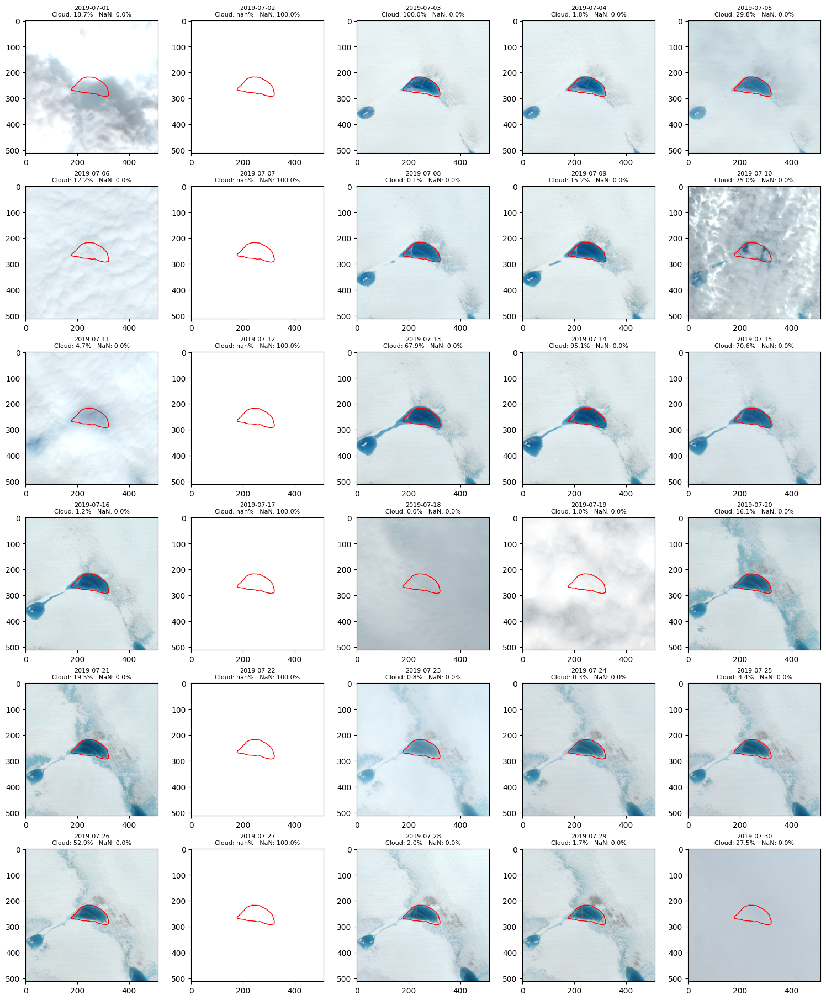

In [14]:
## ============================= ##
## PLOT TO VERIFY LOADING WORKED ##
## ============================= ##

da = ds_mem["reflectance"]           # DataArray with dims (time, band, y, x)

plot_n_days(da, "2019-07-01", ndays=30, cols=5)


In [18]:
## =============================================================================== ##
## LOOP OVER LAKES IN THE .csv FILE AND SAVE EACH TIMESTACK AS A SEPARATE .nc FILE ##
## =============================================================================== ##

from tqdm.auto import tqdm
import time, datetime as dt

# READ IN THE LAKE INFORMATION .geojson FILE
gdf = gpd.read_file("/home/jupyter/repos/lake-vision/sandbox/dunmire_cw2019_shuttle.geojson")
gdf_mask = gpd.read_file("/home/jupyter/repos/lake-vision/sandbox/dunmire_cw2019_shuttle.geojson")

# DECIDE WHETHER TO NORMALIZE THE IMAGERY UPON COMPLIING OR NOT
normalize = True

# SPECIFY TIME RANGE
time_range = '2019-05-01/2019-09-30'

## CONNECT TO MICROSOFT PLANETARY COMPUTER
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,)
print(f"connected to Microsoft Planetary Computer")

# SPECIFY IMAGERY BANDS
band_names = ["B04",  # red (665 nm)
              "B03",  # green (560 nm)
              "B02",  # blue (490 nm)
              "B08"]  # NIR (842 nm)
              # "B11"]  # SWIR1 (1610 nm)

total_start = time.perf_counter()

# LOOP OVER LAKE LOCATIONS
for idx_lake in tqdm(range(78,len(gdf)), desc="Processing lakes"):
    
    iter_start = time.perf_counter()

    print(f"\n working on lake {gdf.iloc[idx_lake].lakenum}")

    # LAKE CENTROID
    centroid = (gdf.iloc[idx_lake].centroid_x, gdf.iloc[idx_lake].centroid_y)

    # CALL FUNCTION TO GENERATE TIMESTACK
    timestack = sattile_stack(catalog, centroid, band_names, pix_res=10, tile_size=512, time_range=time_range, normalize=False, mask=gdf_mask.iloc[[idx_lake]], pull_to_mem=True)

    # WRITE TIMESTACK AS .nc FILE TO DISK
    outfile = f"/home/jupyter/data/2019cw_tstacks/tstack_{gdf.iloc[idx_lake].lakenum}.nc"
    write_netcdf_from_da(timestack, outfile)
    
    tqdm.write(f"lake {gdf.iloc[idx_lake].lakenum} → {dt.timedelta(seconds=time.perf_counter()-iter_start)}")
    
tqdm.write(f"all lakes → {dt.timedelta(seconds=time.perf_counter()-total_start)}")


connected to Microsoft Planetary Computer


Processing lakes:   0%|          | 0/922 [00:00<?, ?it/s]


 working on lake 2019cw_79
epsg for bounds_latlon: 3413
pulling stack into memory, shape will be: (153, 5, 512, 512)
[########################################] | 100% Completed | 72.17 s
shape of stack in memory: (153, 5, 512, 512)
wrote /home/jupyter/data/2019cw_tstacks/tstack_2019cw_79.nc
lake 2019cw_79 → 0:02:49.930717

 working on lake 2019cw_80
epsg for bounds_latlon: 3413
pulling stack into memory, shape will be: (153, 5, 512, 512)
[########################################] | 100% Completed | 55.98 s
shape of stack in memory: (153, 5, 512, 512)
wrote /home/jupyter/data/2019cw_tstacks/tstack_2019cw_80.nc
lake 2019cw_80 → 0:02:23.169902

 working on lake 2019cw_81
epsg for bounds_latlon: 3413
pulling stack into memory, shape will be: (153, 5, 512, 512)
[########################################] | 100% Completed | 81.19 s
shape of stack in memory: (153, 5, 512, 512)
wrote /home/jupyter/data/2019cw_tstacks/tstack_2019cw_81.nc
lake 2019cw_81 → 0:03:10.584855

 working on lake 2019cw_

KeyboardInterrupt: 